## **유사사례 검색**

In [ ]:
import os
import torch
import random
import numpy as np
import pickle as pkl
import PIL
import requests
from PIL import Image
from io import BytesIO
from tqdm import tqdm
import torchvision.transforms as transforms
from torch.utils.data import Dataset
from nndescent.nndescent import NNDescent
import matplotlib.pyplot as plt
import metric

### 이미지 임베딩 로드 

학습된 이미지벡터화 모듈로 탐색하고자 하는 모든 이미지의 임베딩을 추출합니다.

임베딩을 저장한 후, 다음과 같이 로드하여 검색에 사용할 수 있습니다.

In [2]:
with open('contrastive_model_embeddings.pt', 'rb') as f:
    contrastive_model_embeddings = pkl.load(f).numpy()
    
with open('autoencoder_embeddings.pkl', 'rb') as f:
    autoencoder_embeddings = np.array(pkl.load(f))

In [3]:
print(contrastive_model_embeddings.shape)
print(autoencoder_embeddings.shape)

(279176, 256)
(279176, 256)


### k-최근접 이웃 그래프 구조화

임베딩 기반으로 이미지 검색을 하기 위해 k-최근접 이웃 그래프를 만듭니다.

In [4]:
nnds = {}

In [5]:
nnd = NNDescent(contrastive_model_embeddings)
nnds["contrastive_model"] = nnd

nnd = NNDescent(autoencoder_embeddings)
nnds["autoencoder"] = nnd

iter: 0, num_pushes: 28228739, step1: 14.5289, step2: 191.29206687770784, total: 205.82098499126732
iter: 1, num_pushes: 17305749, step1: 4.2407, step2: 194.86980224214494, total: 199.11050686053932
iter: 2, num_pushes: 15809485, step1: 3.8315, step2: 211.52857902273536, total: 215.36012206040323
iter: 3, num_pushes: 8861709, step1: 3.3855, step2: 226.55966988764703, total: 229.9451306089759
iter: 4, num_pushes: 350333, step1: 3.4893, step2: 296.2776796352118, total: 299.76698853075504
iter: 5, num_pushes: 4115, step1: 3.7302, step2: 65.49999938718975, total: 69.23016556166112
iter: 6, num_pushes: 433, step1: 3.0450, step2: 0.33656718023121357, total: 3.381587842479348
iter: 7, num_pushes: 65, step1: 2.3357, step2: 0.13472351618111134, total: 2.470436180010438
iter: 8, num_pushes: 7, step1: 2.4318, step2: 0.053059231489896774, total: 2.4848269801586866
iter: 9, num_pushes: 7, step1: 2.9104, step2: 0.061379324644804, total: 2.971813812851906
iter: 10, num_pushes: 2, step1: 3.2934, step2

### 이미지 검색

k-최근접 이웃 그래프 기반으로 쿼리 이미지로부터 가장 가까운 k개의 이미지를 알아냅니다.

모델은 2010년도~2018년도 이미지를 통해 학습되었습니다.

2019년도~2020년도 이미지를 쿼리 이미지로 하여 검색합니다.

In [50]:
# 쿼리 이미지 표본 구성
random.seed(2023)
num_query = 100
query_index = random.sample(range(240973, 279176), num_query)

In [51]:
K = 1000
result_indexes, result_dists = {}, {}

for modelname, nnd in nnds.items():
    # 쿼리 이미지로부터 가까운 이미지 K+1개를 탐색
    result_index, result_dist = nnd.query(nnd.data[query_index], k=K+1)
    # 결과 저장
    result_indexes[modelname] = result_index
    result_dists[modelname] = result_dist

### 이미지 검색 결과 시각화

메트릭 학습(metric learning) 방법의 모델과 오토인코더(autoencoder) 결과를 보입니다.

쿼리이미지와 각 모델에서 추출된 임베딩 기반으로 검색된 이미지의 결과를 출력합니다.

이때, 3등까지(top_k으로 변수화) 가장 가까운 이미지를 출력합니다.

In [52]:
tf = transforms.ToTensor()
top_k = 3
test_index = 240973 
with open('data_list.pkl', 'rb') as f:
    data_list = pkl.load(f)
with open('date_list.pkl', 'rb') as f:
    date_list = pkl.load(f)
server_url = 'http://dmlab.kaist.ac.kr/~geonlee/1300_1500/'

In [53]:
def file_to_date(filename):
    term = filename.split('/')[-1][:-4].split('_')[-1]
    year, month, day, hour, minute = term[0:4], term[4:6], term[6:8], term[8:10], term[10:12]
    return '{}-{}-{} {}:{}'.format(year, month, day, hour, minute)

In [54]:
def plot(imgs, names):
    query_img = imgs[0]
    
    num_cols = len(imgs)
    fig, axs = plt.subplots(nrows=1, ncols=num_cols, squeeze=False, figsize=(50,20))
    for col_idx, img in enumerate(imgs):
        ax = axs[0, col_idx]
        ax.imshow(np.asarray(img),cmap="gray")
        ax.set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])
        ax.set(title=names[col_idx])
        ax.title.set_size(30)
        
    plt.tight_layout()
    plt.show()

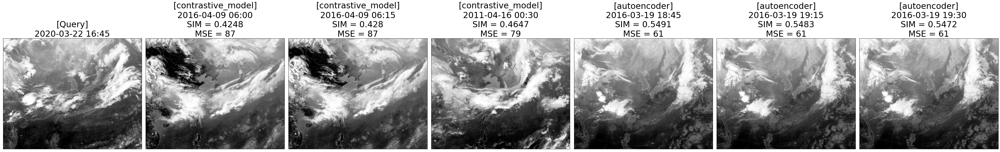

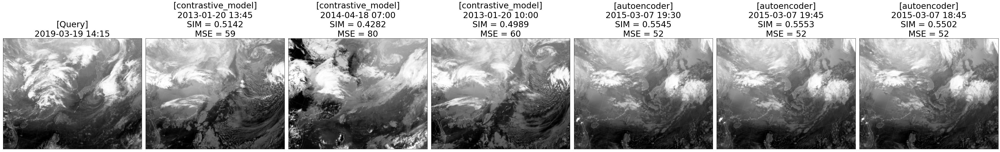

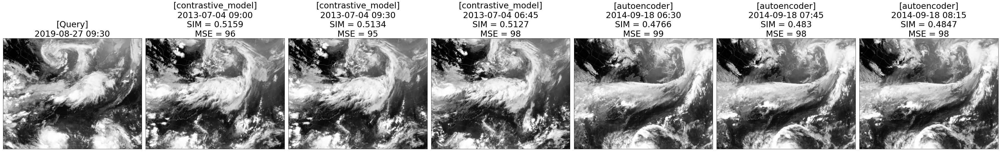

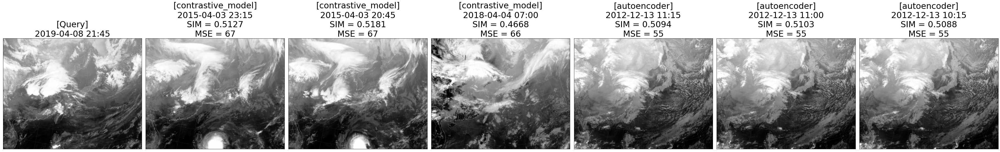

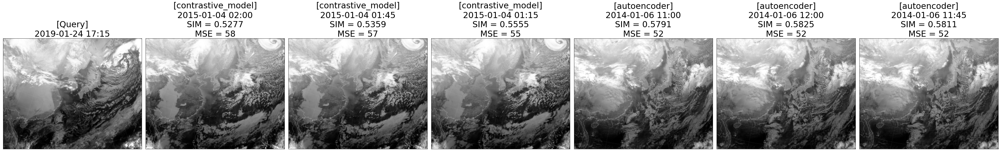

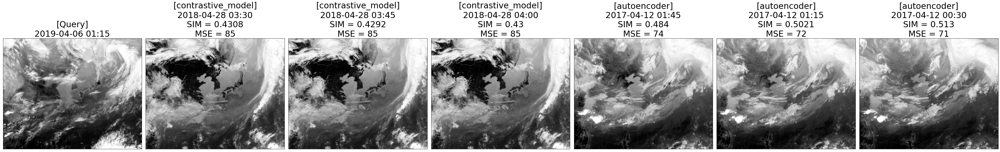

In [76]:
showindex = [4,6,8, 19, 33, 34]
showquery = [278395, 247529, 260854, 249237, 242975, 248994]
for i, query in zip(showindex, showquery):
    images = []
    names = []
    
    query_f = os.path.join(server_url, data_list[query])
    response = requests.get(query_f)
    img_q = Image.open(BytesIO(response.content))
    img_q_mat = transforms.ToTensor()(img_q).squeeze(0)
    images.append(img_q)
    names.append("[Query]\n" + file_to_date(query_f))
    
    for modelname in result_indexes.keys():
        result_dist = result_dists[modelname][i]
        result_index = result_indexes[modelname][i]
        resort_index = np.argsort(result_dist)
        result_dist = result_dist[resort_index]
        result_index = result_index[resort_index]
        
        cnt = 0
        for image_idx in result_index:
            f = os.path.join(server_url, data_list[image_idx])
            if f == query_f:
                continue
            if image_idx >= test_index:
                continue
            
            response = requests.get(f)
            img = Image.open(BytesIO(response.content))
            img_mat = transforms.ToTensor()(img).squeeze(0)
            
            mse = int(np.linalg.norm(img_mat - img_q_mat))
            sim = int(metric.calculate_image_similarity(img_q_mat, img_mat) * 10000) / 10000
            
            images.append(img)
            names.append("[" + modelname + "]\n" + file_to_date(f) + '\nSIM = ' + str(sim) + '\nMSE = ' + str(mse))
            
            cnt += 1
            if cnt == top_k:
                break
    plot(images, names)
    print("\n\n================================================================================================================================================================================================\n\n")